## Task 2: Data Preprocessing and Analysis
Extract frames from the video at regular intervals and preprocess them for analysis. Perform a basic analysis on the frames, such as object detection or scene classification. Discuss your findings and any difficulties encountered.


### Observations:

### Problem observations

1. My very first thought after reading the problem was, how to interpret the task. Then, after re-reading it, I realized it is fundamentally -> frame extraction + object detection. I made the assumption it doesn't need to be in realtime since, it is an analysis task as opposed to decision making.

2. The problem also made me think about the trade-off between processing all frames and sampling only some of them. Extracting frames at regular intervals felt like a good balance because it reduced computation while still preserving the overall content of the video.

### Result observations

1. The results were useful because the sampled frames still captured the main visual content of the video, even though I did not analyze every single frame. This showed me that for analysis, regular sampling is enough to get a reasonable overview.

2. The object detection output was easy to interpret because the annotations made it visible immediately. I found that this made the analysis feel more concrete than just printing labels with confidence scores.

3. Looking at the object detection summary I can see there 271 cars detected across the entire 84 frames. Which is not representative of 271 unique cars so, in the future to track them would be a good strategy.

### Solution strategy & challenges

1. My strategy was to keep the pipeline simple: extract frames, resize the images, collect them then, run YOLO on them, and then visualize the outputs. I think this worked quite well. I had a 1min 20sec (84seconds) video at 29 FPS which led to 2419 frames; I sampled every second so, that meant collecting every 29th frame, this led to 84 frames.

2. I batched the images into a numpy array of (84, 360, 640, 3) but, YoLo either supports single image of (360, 640, 3) or a list of these numpy images. Which seemed weird since, batching in neural networks is often better but, here it wasn't the case. So, I passed a list of images.

3. I initially tried to make a widget to scrub through a batch of 4 images but, the slider was not showing up in the UI so, I decided to simply create a GIF and display it. In fact, this worked better. 

In [1]:
!yt-dlp -f "best[height<=720][ext=mp4]" \
        --recode-video mp4 \
        --postprocessor-args "ffmpeg:-c:v libx264 -preset fast -crf 23" \
        "https://www.youtube.com/watch?v=EJ5NKh2ehjg" \
        -o "./fixed_output.mp4"

[youtube] Extracting URL: https://www.youtube.com/watch?v=EJ5NKh2ehjg
[youtube] EJ5NKh2ehjg: Downloading webpage
[youtube] EJ5NKh2ehjg: Downloading android vr player API JSON
[info] EJ5NKh2ehjg: Downloading 1 format(s): 18
[download] ./fixed_output.mp4 has already been downloaded
[download] 100% of    7.32MiB
[VideoConvertor] Not converting media file "./fixed_output.mp4"; already is in target format mp4


In [2]:
from IPython.display import Video

Video("./fixed_output.mp4")

In [3]:
from ultralytics import YOLO
model = YOLO("yolo26n.pt").eval()
model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C3k2(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_

In [4]:
import cv2
import numpy as np

cap = cv2.VideoCapture("./fixed_output.mp4")
frame_id = 0
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

print(f"FPS: {fps}, Total frames {total_frames}, Duration: {total_frames/fps:.2f}s")

frames = []
frame_ids = []
sample_every = 29
while True:
    ret, frame = cap.read()
    if not ret:
        break

    if frame_id % sample_every == 0:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        frame_ids.append(frame_id)

    frame_id += 1

cap.release()

print(f"Total Frames: {len(frames)}")

FPS: 29, Total frames 2419, Duration: 83.41s
Total Frames: 84


In [5]:
output_frames = model(frames)
type(output_frames)


0: 384x640 (no detections), 76.4ms
1: 384x640 2 persons, 1 bicycle, 1 car, 76.4ms
2: 384x640 2 persons, 1 bicycle, 4 cars, 1 bus, 76.4ms
3: 384x640 2 persons, 1 bicycle, 3 cars, 76.4ms
4: 384x640 2 persons, 2 cars, 1 traffic light, 1 fire hydrant, 76.4ms
5: 384x640 1 person, 4 cars, 76.4ms
6: 384x640 1 person, 4 cars, 76.4ms
7: 384x640 2 persons, 8 cars, 76.4ms
8: 384x640 1 person, 1 car, 2 trucks, 1 traffic light, 76.4ms
9: 384x640 1 person, 3 cars, 1 traffic light, 76.4ms
10: 384x640 2 persons, 3 cars, 3 trucks, 76.4ms
11: 384x640 2 persons, 1 bicycle, 1 car, 1 truck, 76.4ms
12: 384x640 1 person, 1 bicycle, 3 cars, 1 traffic light, 76.4ms
13: 384x640 1 person, 4 cars, 1 motorcycle, 76.4ms
14: 384x640 1 person, 3 cars, 1 truck, 1 traffic light, 76.4ms
15: 384x640 1 person, 1 bicycle, 6 cars, 1 truck, 76.4ms
16: 384x640 1 person, 1 bicycle, 6 cars, 76.4ms
17: 384x640 1 person, 1 bicycle, 7 cars, 76.4ms
18: 384x640 1 person, 1 bicycle, 8 cars, 76.4ms
19: 384x640 4 cars, 76.4ms
20: 384x

list

### Statistics about the frames

In [6]:
from collections import Counter

all_objects = []
for i, result in enumerate(output_frames):
    if result.boxes is not None:
        classes = result.boxes.cls.numpy()
        all_objects.extend([model.names[int(c)] for c in classes])

In [7]:
from IPython.display import Markdown

md = "## Output Summary"
total_detections = Counter(all_objects)
for idx, (obj, count) in enumerate(total_detections.most_common(10), 1):
    md += f"\n{idx}. {obj}: {count} detections"

Markdown(md)

## Output Summary
1. car: 271 detections
2. person: 201 detections
3. bicycle: 29 detections
4. truck: 20 detections
5. motorcycle: 15 detections
6. traffic light: 13 detections
7. bus: 7 detections
8. fire hydrant: 2 detections
9. suitcase: 2 detections
10. train: 1 detections

In [8]:
annotated_frames = []
for result in output_frames:
    annotated = result.plot()  # draws boxes
    annotated_frames.append(annotated)
len(annotated_frames)

84

### Output gif of the video :)

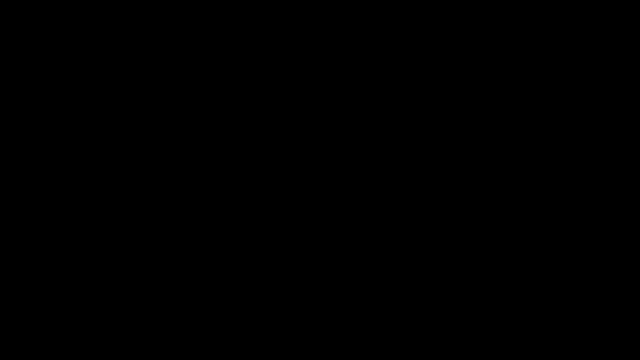

In [9]:
import imageio.v2 as imageio
import matplotlib.pyplot as plt
from IPython.display import Image

frames_rgb = [cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) for frame in annotated_frames]

imageio.mimsave(
    "annotated_detection.gif",
    frames_rgb,
    fps=4
)

Image("./annotated_detection.gif")